# CRISP-DM for AirBnB Seattle Data Set

This notebook explores the AirBnB Seattle data set from Kaggle: https://www.kaggle.com/airbnb/seattle

The CRISP-DM structure used is:
- Business Understanding
- Data Understanding
- Prepare Data
- Data Modeling
- Evaluation

## 1. Business Understanding

Interesting questions could be:
- **Question 1:** Which property type has the highest booking rates?
- **Question 2:** Does the average booking rate of neighborhoods vary over the year?
- **Question 3:** Predict the booking rate.

## 2. Data Understanding

In [474]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import sklearn, sklearn.datasets, sklearn.svm, sklearn.linear_model

### Gather the data

In [475]:
df_calendar = pd.read_csv('calendar.csv')
df_listings = pd.read_csv('listings.csv')
df_reviews = pd.read_csv('reviews.csv')

### Assess the data

In [476]:
df_reviews.dtypes

listing_id        int64
id                int64
date             object
reviewer_id       int64
reviewer_name    object
comments         object
dtype: object

In [477]:
df_reviews.shape

(84849, 6)

In [478]:
df_calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [479]:
df_calendar.sample(5)

,listing_id,date,available,price
600781,4410544,2016-12-25,f,NaN
1309379,7871885,2016-05-07,t,$125.00
73880,7381677,2016-06-02,f,NaN
935317,8505940,2016-07-09,f,NaN
358645,8703557,2016-08-06,t,$99.00


In [480]:
df_calendar.dtypes

listing_id     int64
date          object
available     object
price         object
dtype: object

In [481]:
df_calendar.shape

(1393570, 4)

In [482]:
# collect information about the input_df
def analyze_dataframe(input_df):
    """
    Print out name, sample, dtype, percentage of missing vals, mean/mode and std for each column.
    """
    df = pd.DataFrame()
    for col in input_df.columns:
        d = {}
        # get information for this column
        d['name'] = col
        d['sample'] = input_df[col].sample(1)
        d['dtype'] = input_df[col].dtype
        d['missing'] = input_df[col].isnull().sum() / len(input_df)

        if d['dtype'] in ['float64', 'int64']:
            d['mean/mode'] = input_df[col].mean()
            d['std'] = input_df[col].std()
        else:
            d['mean/mode'] = 'N/A'
            d['std'] = 'N/A'

        df=df.append(pd.DataFrame(data=d), ignore_index=True)
    return df

In [483]:
df = analyze_dataframe(df_listings)
pd.set_option('display.max_rows', None)
df

,name,sample,dtype,missing,mean/mode,std
0,id,9568491,int64,0.000000,5.55011e+06,2.96266e+06
1,listing_url,https://www.airbnb.com/rooms/571651,object,0.000000,N/A,N/A
2,scrape_id,20160104002432,int64,0.000000,2.01601e+13,0
3,last_scraped,2016-01-04,object,0.000000,N/A,N/A
4,name,Studio in Eastlake/New apt building,object,0.000000,N/A,N/A
5,summary,Freshly remodeled apartment in recently gutted...,object,0.046359,N/A,N/A
6,space,The most special quality of our space is the e...,object,0.149031,N/A,N/A
7,description,Treat yourself to this luxury penthouse condo ...,object,0.000000,N/A,N/A
8,experiences_offered,none,object,0.000000,N/A,N/A
9,neighborhood_overview,*Minutes from all the popular tourist spots(UR...,object,0.270299,N/A,N/A


In [484]:
cleaned = df_listings

## Drop IDs and URLs and redundant columns

Identify columns that should be dropped by scanning the above table visually and using the background knowledge on the business domain. This led to the following decisions:
- Delete all URLs, as they do not directly contribute and are unique
- Delete all unnecessary IDs as they are unique random values
- Delete all columns that contain roughly the same value, as the whole data set is only focussed on Seattle
- Delete obviously unnecessary calendar entries
- Square_feet and license are deleted, as this column mostly consists of null values

In [485]:
# All URLs
cleaned = cleaned.drop(columns=['thumbnail_url',
                                'medium_url',
                                'picture_url',
                                'xl_picture_url',
                                'host_url',
                                'host_thumbnail_url',
                                'host_picture_url',
                                'listing_url'])

# All id$
cleaned = cleaned.drop(columns=['scrape_id',                              
                                'host_id'])

# All the same
cleaned = cleaned.drop(columns=['city',
                                'state',
                                'market',
                                'smart_location',
                                'country_code',
                                'country',
                                'calendar_last_scraped',
                                'license',
                                'jurisdiction_names',
                                'host_listings_count',
                                'square_feet']) # missing in most columns

# Neighborhoods- redundant to neighbourhood_cleansed
cleaned = cleaned.drop(columns=['neighbourhood',
                                'neighbourhood_group_cleansed',
                               'host_location'])

# Uninteresting date-related information
cleaned.drop(columns=['calendar_updated'])

,id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,host_name,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,Maija,2011-08-11,"I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,Queen Anne,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",West Queen Anne,98119,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$85.00,NaN,NaN,NaN,NaN,2,$5.00,1,365,t,14,41,71,346,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,f,moderate,f,f,2,4.07
1,953595,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",Andrea,2013-02-21,Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,t,Queen Anne,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"7th Avenue West, Seattle, WA 98119, United States",West Queen Anne,98119,47.639123,-122.365666,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,1,$0.00,2,90,t,13,13,16,291,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,f,strict,t,t,6,1.48
2,3308979,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,Our house is located just 5 short blocks to To...,A bus stop is just 2 blocks away. Easy bus a...,Jill,2014-06-12,i love living in Seattle. i grew up in the mi...,within a few hours,67%,100%,f,Queen Anne,2.0,"['email', 'phone', 'google', 'reviews', 'jumio']",t,t,"West Lee Street, Seattle, WA 98119, United States",West Queen Anne,98119,47.629724,-122.369483,t,House,Entire home/apt,11,4.5,5.0,7.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$975.00,NaN,NaN,"$1,000.00",$300.00,10,$25.00,4,30,t,1,6,17,220,20,2014-07-30,2015-09-03,97.0,10.0,10.0,10.0,10.0,10.0,10.0,f,f,strict,f,f,2,1.15
3,7421966,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,NaN,NaN,Emily,2013-11-06,NaN,NaN,NaN,NaN,f,Queen Anne,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t,t,"8th Avenue West, Seattle, WA 98119, United States",West Queen Anne,98119,47.638473,-122.369279,t,Apartment,Entire home/apt,3,1.0,0.0,2.0,Real Bed,"{Internet,""Wireless Internet"",Kitchen,""Indoor ...",$100.00,$650.00,"$2,300.00",NaN,NaN,1,$0.00,1,1125,t,0,0

In [486]:
cleaned.shape

(3818, 68)

## Repair Data Types
The data set consists columns with Boolean values that are encoded as 't' and 'f', as well as percentage or dollar values that are not in float format. To select the right columns based on a criteria, the following method will be used:

In [487]:
def criteria2columns(df, criteria_lmbd, axis = 0):
    """
    Create a list of column names in df that match a given criteria on the axis.
    Input:
        df: Pandas DataFrame
        criteria_lmbd: lambda function that is applied on each column
        axis: axis to apply the selection criteria. Default 0.
    """
    criteria = df.apply(criteria_lmbd, axis=axis)
    return list(df[criteria.index[criteria]].columns)

### Percentage values
All columns are selected that contain at least one string with '%'

In [488]:
criteria2columns(cleaned, lambda x: np.any(['%' in str(s) for s in x]))

['name',
 'summary',
 'space',
 'description',
 'neighborhood_overview',
 'notes',
 'transit',
 'host_about',
 'host_response_rate',
 'host_acceptance_rate']

Obviously only the columns `host_response_rate` and `host_acceptance_rate` need to be transformed.       

In [489]:
def percentage2float(df, columns, inplace = True):
    """
    Converts strings that contain a percentage sign to real floats.
    """
    if not inplace:
        df = df.copy()
    for col in columns:
        df[col] = df[col].apply(lambda x: float(str(x).replace('%', ''))/100.)
    return df

In [490]:
cleaned = percentage2float(cleaned, columns = ['host_response_rate',
                                               'host_acceptance_rate'])

### Dollar values
Change values that contain a dollar sign to floats. First, a list of candidate columns is generated:

In [491]:
criteria2columns(cleaned, lambda x: np.any(['$' in str(s) for s in x]))

['name',
 'summary',
 'space',
 'description',
 'neighborhood_overview',
 'notes',
 'transit',
 'host_about',
 'price',
 'weekly_price',
 'monthly_price',
 'security_deposit',
 'cleaning_fee',
 'extra_people']

Obviously only the columns price `price`, `weekly_price`, `monthly_price`, `security_deposit`, `cleaning_fee`, `extra_people`, `security_deposit` contain real prices and will be transformed.

In [492]:
def dollar2float(df, columns, inplace= True):
    """
    Converts strings that contain a dollar sign to real floats.
    """
    if not inplace:
        df = df.copy()
    for col in columns:
        df[col] = df[col].apply(lambda x: float(str(x).replace('$', '').replace(',','')))
    return df

In [493]:
cleaned = dollar2float(cleaned, columns= ['price', 
                                          'weekly_price',
                                          'monthly_price',
                                          'security_deposit',
                                          'cleaning_fee',
                                          'extra_people'])

Also apply this to the `df_calendar` table:

In [494]:
df_calendar = dollar2float(df_calendar, columns= ['price'])

### Boolean values
Change boolean values from 't' and 'f' to 0 and 1. First a list of all relevant columns is generated:

In [495]:
bool_col_names = criteria2columns(cleaned, lambda x: 't' in x.unique())
bool_col_names

['host_is_superhost',
 'host_has_profile_pic',
 'host_identity_verified',
 'is_location_exact',
 'has_availability',
 'instant_bookable',
 'require_guest_profile_picture',
 'require_guest_phone_verification']

In [496]:
def val2bool(df, true_pattern, columns, inplace = True):
    """
    Replaces each column in columns by a boolean column, whereby the entry is 1
    if the original value matched true_pattern.
    """
    if not inplace:
        df = df.copy()
    df[columns] = df[columns].applymap(lambda x: 1 if x==true_pattern else 0)
    return df

The transformation is applied to the previously selected pseudo-boolean columns:

In [497]:
cleaned = val2bool(cleaned, 't', bool_col_names)

Also apply on the `df_calendar` table:

In [498]:
df_calendar = val2bool(df_calendar, 't', ['available'])

In [499]:
df_calendar.sample(2)

,listing_id,date,available,price
1210338,8426749,2017-01-01,1,98.0
47120,3303978,2016-02-08,0,NaN


### Timestamp values

Timestamps are recorded as strings/object in the DataFrame. In order to make them usable, they are parsed and converted to the according pandas dtype. First, the candidate columns are selected based on the pattern `yyyy-mm-dd`:

In [500]:
ts_column_names = criteria2columns(cleaned.select_dtypes('object'),
                                   lambda x: np.any(x.str.contains(r'\d{4}-\d{2}-\d{2}')))
ts_column_names

['last_scraped', 'host_since', 'first_review', 'last_review']

Convert the identified timestamp columns to real timestamp dtypes:

In [501]:
cleaned[ts_column_names] = cleaned[ts_column_names].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'), axis=0)
cleaned.shape

(3818, 68)

Also conduct this cleaning on the `df_calendar` table:

In [502]:
ts_column_names = criteria2columns(df_calendar.select_dtypes('object'),
                                   lambda x: np.any(x.str.contains(r'\d{4}-\d{2}-\d{2}')))

In [503]:
ts_column_names

['date']

In [504]:
df_calendar[ts_column_names] = df_calendar[ts_column_names].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'), axis=0)
df_calendar.shape

(1393570, 4)

## Extract New Features

New features will be extracted from strings and geo-coordinates. This is done before the dropping of columns to make sure that these features will also be dropped in case they turn out to be uninteresting.

### Length of free text strings

For each `object` column, a new column is created that represents the length of the free text string. This could be interesting, for example if a longer description helps to land bookings.

In [505]:
candidate_columns = cleaned.select_dtypes('object')
candidate_columns.describe()

,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,host_name,host_about,host_response_time,host_neighbourhood,host_verifications,street,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,amenities,calendar_updated,requires_license,cancellation_policy
count,3818,3641,3249,3818,3818,2786,2212,2884,3816,2959,3295,3518,3818,3818,3818,3811,3817,3818,3818,3818,3818,3818,3818
unique,3792,3478,3119,3742,1,2506,1999,2574,1466,2011,4,102,116,1442,87,28,16,3,5,3284,34,1,3
top,Capitol Hill Apartment,This is a modern fully-furnished studio apartm...,"*Note: This fall, there will be major renovati...",Our space is a mix of a hostel and a home. We ...,none,Wallingford is a mostly-residential neighborho...,All of our rentals are fully licensed and regu...,Convenient public transportation. The location...,Andrew,It would be my pleasure to share and explore t...,within an hour,Capitol Hill,"['email', 'phone', 'facebook', 'reviews', 'kba']","1st Avenue, Seattle, WA 98101, United States",Broadway,98122,House,Entire home/apt,Real Bed,{},today,f,strict
freq,3,15,14,10,3818,17,39,32,56,46,1692,405,595,30,397,420,1733,2541,3657,45,706,3818,1417


The following method will help to append a column with the length of the strings. 

In [506]:
def strings2length(df, columns):
    """
    Replaces the strings in each given column by an integer indicating the length of the the strings.
    """
    for col in columns:
        df[col + '_length'] = df[col].apply(lambda x: len(str(x)))
    return df

Apply the conversion to the free text string values (values that do not represent categorical values):

In [507]:
is_free_text_col = candidate_columns.describe().loc['unique'] > len(cleaned)*0.3
free_text_columns = candidate_columns[is_free_text_col.index[is_free_text_col]].keys()
list(free_text_columns)

['name',
 'summary',
 'space',
 'description',
 'neighborhood_overview',
 'notes',
 'transit',
 'host_name',
 'host_about',
 'street',
 'amenities']

All will be used except for `amenities`, as this is no free text column:

In [508]:
cleaned.columns

Index(['id', 'last_scraped', 'name', 'summary', 'space', 'description',
       'experiences_offered', 'neighborhood_overview', 'notes', 'transit',
       'host_name', 'host_since', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood_cleansed', 'zipcode', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'price',
       'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
       'calendar_updated', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'first_review', 'last_review',
 

In [509]:
selected_free_text_columns = ['summary',
                             'space',
                             'description',
                             'neighborhood_overview',
                             'notes',
                             'transit',
                             'host_name',
                             'host_about',
                             'street']
cleaned = strings2length(df=cleaned, columns=selected_free_text_columns)

In [510]:
# Drop them
cleaned = cleaned.drop(columns=selected_free_text_columns)

In [511]:
cleaned.describe()

,id,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,summary_length,space_length,description_length,neighborhood_overview_length,notes_length,transit_length,host_name_length,host_about_length,street_length
count,3.818000e+03,3295.000000,3045.000000,3818.000000,3816.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3802.000000,3812.000000,3817.000000,3818.000000,2009.000000,1517.000000,1866.000000,2788.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.0,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3171.000000,3160.000000,3165.000000,3160.000000,3167.000000,3163.000000,3162.000000,3818.000000,3818.000000,3818.000000,3818.000000,3191.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,5.550111e+06,0.948868,0.999672,0.203772,7.157757,0.997643,0.784966,47.628961,-122.333103,0.893662,3.349398,1.259469,1.307712,1.735394,127.976166,788.481832,2613.336190,287.610397,61.710904,1.672603,10.667627,2.369303,780.447617,1.0,16.786276,36.814825,58.082504,244.772656,22.223415,94.539262,9.636392,9.556398,9.786709,9.809599,9.608916,9.452245,0.154793,0.084075,0.098219,2.946307,2.078919,222.266894,523.122839,870.035097,287.933735,164.184390,214.478261,6.356731,356.538502,50.707962
std,2.962660e+06,0.118667,0.018122,0.402854,28.628149,0.048501,0.410900,0.043052,0.031745,0.308311,1.977599,0.590369,0.883395,1.139480,90.250022,532.352269,1722.267981,270.222690,48.830341,1.311040,17.585922,16.305902,1683.589007,0.0,12.173637,23.337541,34.063845,126.772526,37.730892,6.606083,0.698031,0.797274,0.595499,0.568211,0.629053,0.750259,0.361755,0.277537,0.297649,5.893029,1.822348,78.016811,386.442093,265.654235,289.743222,230.343154,235.687958,3.255761,430.046080,5.084236
min,3.335000e+03,0.170000,0.000000,0.000000,1.000000,0.000000,0.000000,47.505088,-122.417219,0.000000,1.000000,0.000000,0.000000,1.000000,20.000000,100.000000,500.000000,95.000000,5.000000,0.000000,0.000000,1.000000,1.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,3.000000,2.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.020000,3.000000,3.000000,11.000000,2.000000,1.000000,1.000000,1.000000,3.000000,26.000000
25%,3.258256e+06,0.980000,1.000000,0.000000,1.000000,1.000000,1.000000,47.609418,-122.354320,1.000000,2.000000,1.000000,1.000000,1.000000,75.000000,455.000000,1512.000000,150.000000,25.000000,1.000000,0.000000,1.000000,60.000000,1.0,2.000000,13.000000,28.000000,124.000000,2.000000,93.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,0.000000,0.000000,0.000000,1.000000,0.695000,213.000000,165.250000,995.250000,3.000000,3.000000,12.000000,5.000000,46.000000,47.000000
50%,6.118244e+06,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,47.623601,-122.328874,1.000000,3.000000,1.000000,1.000000,1.000000,100.000000,650.000000,2200.000000,250.000000,50.000000,1.000000,0.000000,2.000000,1125.000000,1.0,20.000000,46.000000,73.000000,308.000000,9.000000,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.000000,0.000000,0.000000,1.000000,1.540000,242.000000,464.500000,1000.000000,224.000000,74.000000,150.000000,6.000000,240.000000,51.000000
75%,8.035127e+06,1.000000,1.000000,0.000000,3.000000,1.000000,1.000000,47.662694,-122.310800,1.0000

### Average proximity to 5 nearest hosts

The idea behind this feature is that in areas with high density of hosts the competition might be tougher and could impact the price or booking rate. Thus, using the kNN approach, the average distance to the k=5 nearest other hosts is added as a seperate column.

In [512]:
def dist(lat1, lon1, lat2, lon2):
    """
    Returns the distance between two WGS84 coordinates in meters.
        Input:
            - lat1 (float): WGS84 latitude of point 1 in degrees
            - lon1 (float): WGS84 longitude of point 1 in degrees
            - lat2 (float): WGS84 latitude of point 2 in degrees
            - lon2 (float): WGS 84 longitude of point 2 in degrees
        Output:
            - Distance of point 1 and point 2 in kilometers
    """
    r_earth = 6378 # earth radius in km
    
    delta_lon_deg = np.abs(lat1 - lat2)
    delta_lat_deg = np.abs(lon1 - lon2)

    # Convert to distance in meters
    delta_lon_km = (2.*np.pi/360.) * r_earth * np.cos(delta_lon_deg) * delta_lon_deg * 1000.
    delta_lat_km = (2.*np.pi/360.) * r_earth * delta_lat_deg * 1000.
    
    dist = np.linalg.norm([delta_lon_km, delta_lat_km], ord=2)
    return dist

In [513]:
p1 = cleaned[['latitude', 'longitude']].iloc[7]
p2 = cleaned[['latitude', 'longitude']].iloc[9]
dist(p1[0], p1[1], p2[0], p2[1])

1041.4938803198843

In [514]:
from tqdm import tqdm
def extract_knn_dists(df, k=5):
    """
    Given a dataframe df with columns 'latitude' and 'longitude', a new column 'knn_dist' is added, representing
    the average distance to the 5 nearest neighbors of each element.
    
    Time complexity if O(n**3 * log(n))
    """
    d = {'knn_dists':[], 'id':[]}
    # for each property in df
    for index, row in tqdm(df.iterrows(), total=len(df)):
        # lat lon for this property
        lat, lon = row['latitude'], row['longitude']
        
        # calculate the distances to all other properties
        dists = df.apply(lambda arg: dist(lat, lon, arg['latitude'], arg['longitude']), axis=1)
        
        # perform k Nearest Neighbors and compute the average
        knn_dist = np.nan
        if len(dists)  > 0:
            knn_dist = dists.sort_values().head(k).mean()
            
        # save in output dataframe
        d['knn_dists'].append(knn_dist)
        d['id'].append(row['id'])
            
    return pd.DataFrame(data=d)

In [515]:
try:
    knn_dists = pd.read_csv('knn_dists.csv', index_col=False)
except:
    knn_dists = extract_knn_dists(cleaned, k=5)

In [516]:
knn_dists.to_csv('knn_dists.csv', index=False)

In [517]:
knn_dists['knn_dists'].describe()

count    3818.000000
mean      138.614433
std       112.332659
min        14.542950
25%        64.867259
50%       107.696599
75%       175.817885
max      1363.531219
Name: knn_dists, dtype: float64

In [518]:
cleaned = pd.concat([cleaned, knn_dists['knn_dists']], axis=1)

In [519]:
cleaned.describe()

,id,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,summary_length,space_length,description_length,neighborhood_overview_length,notes_length,transit_length,host_name_length,host_about_length,street_length,knn_dists
count,3.818000e+03,3295.000000,3045.000000,3818.000000,3816.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3802.000000,3812.000000,3817.000000,3818.000000,2009.000000,1517.000000,1866.000000,2788.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.0,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3171.000000,3160.000000,3165.000000,3160.000000,3167.000000,3163.000000,3162.000000,3818.000000,3818.000000,3818.000000,3818.000000,3191.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,5.550111e+06,0.948868,0.999672,0.203772,7.157757,0.997643,0.784966,47.628961,-122.333103,0.893662,3.349398,1.259469,1.307712,1.735394,127.976166,788.481832,2613.336190,287.610397,61.710904,1.672603,10.667627,2.369303,780.447617,1.0,16.786276,36.814825,58.082504,244.772656,22.223415,94.539262,9.636392,9.556398,9.786709,9.809599,9.608916,9.452245,0.154793,0.084075,0.098219,2.946307,2.078919,222.266894,523.122839,870.035097,287.933735,164.184390,214.478261,6.356731,356.538502,50.707962,138.614433
std,2.962660e+06,0.118667,0.018122,0.402854,28.628149,0.048501,0.410900,0.043052,0.031745,0.308311,1.977599,0.590369,0.883395,1.139480,90.250022,532.352269,1722.267981,270.222690,48.830341,1.311040,17.585922,16.305902,1683.589007,0.0,12.173637,23.337541,34.063845,126.772526,37.730892,6.606083,0.698031,0.797274,0.595499,0.568211,0.629053,0.750259,0.361755,0.277537,0.297649,5.893029,1.822348,78.016811,386.442093,265.654235,289.743222,230.343154,235.687958,3.255761,430.046080,5.084236,112.332659
min,3.335000e+03,0.170000,0.000000,0.000000,1.000000,0.000000,0.000000,47.505088,-122.417219,0.000000,1.000000,0.000000,0.000000,1.000000,20.000000,100.000000,500.000000,95.000000,5.000000,0.000000,0.000000,1.000000,1.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,3.000000,2.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.020000,3.000000,3.000000,11.000000,2.000000,1.000000,1.000000,1.000000,3.000000,26.000000,14.542950
25%,3.258256e+06,0.980000,1.000000,0.000000,1.000000,1.000000,1.000000,47.609418,-122.354320,1.000000,2.000000,1.000000,1.000000,1.000000,75.000000,455.000000,1512.000000,150.000000,25.000000,1.000000,0.000000,1.000000,60.000000,1.0,2.000000,13.000000,28.000000,124.000000,2.000000,93.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,0.000000,0.000000,0.000000,1.000000,0.695000,213.000000,165.250000,995.250000,3.000000,3.000000,12.000000,5.000000,46.000000,47.000000,64.867259
50%,6.118244e+06,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,47.623601,-122.328874,1.000000,3.000000,1.000000,1.000000,1.000000,100.000000,650.000000,2200.000000,250.000000,50.000000,1.000000,0.000000,2.000000,1125.000000,1.0,20.000000,46.000000,73.000000,308.000000,9.000000,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.000000,0.000000,0.000000,1.000000,1.540000,242.000000,464.500000,1000.000000,224.000000,74.000000,150.000000,6.000000,240.000000,51.000000,107.696599
75%,8.035127e+06,1.00000

### Availability rate

This feature is extracted for each listing and shows the when the listing was offered by the host in the calendar.

In [520]:
# booking rate for each listing
def add_availability_rate(df):
    """
    Input:
        - x (DataFrame): a row of the df_listings table representing one property
    Output:
        - The average booking rate for the given property
    """
    d = {'availability':[]}
    for index, row in df.iterrows():
        d['availability'].append(df_calendar[df_calendar['listing_id'] == row.id]['available'].mean())
    return pd.DataFrame(data=d)

availability = add_availability_rate(cleaned)

In [521]:
cleaned = pd.concat([cleaned, availability], axis='columns')

In [522]:
availability.columns

Index(['availability'], dtype='object')

In [523]:
cleaned['availability'].describe()

count    3818.000000
mean        0.670610
std         0.347322
min         0.000000
25%         0.339726
50%         0.843836
75%         0.986301
max         1.000000
Name: availability, dtype: float64

### Age of listing

The age of an listing could also be interesting. Maybe people recommend it by word of mouth or the host gains experience to offer a better property.

In [524]:
age = (cleaned['last_scraped'] - cleaned['host_since']).apply(lambda x: x.days)
d = {'age':age}
age_df = pd.DataFrame(data=d)

In [525]:
cleaned = pd.concat([cleaned, age_df], axis=1)

## Drop Unimportant Columns

### Drop unimportant numeric columns

For numeric columns, the ratio of each value to the mean in that column is computed as normalization. It is evaluated using the standard deviation of that ratios. Values with a low standard deviation are centered around the mean, where values with higher standard deviation are spread wider around the means.

In [526]:
pd.set_option('display.max_columns', None)
numeric_columns = cleaned.select_dtypes(include=['float64', 'int64'])

# normalize by deviding by the mean
length_std = (numeric_columns / numeric_columns.mean()).std().sort_values()
length_std

has_availability                    0.000000
longitude                           0.000259
latitude                            0.000904
host_acceptance_rate                0.018128
host_has_profile_pic                0.048615
review_scores_communication         0.057924
review_scores_checkin               0.060848
review_scores_location              0.065466
review_scores_rating                0.069877
review_scores_accuracy              0.072437
review_scores_value                 0.079374
review_scores_cleanliness           0.083428
street_length                       0.100265
host_response_rate                  0.125062
description_length                  0.305337
is_location_exact                   0.344997
summary_length                      0.351005
bathrooms                           0.468745
host_name_length                    0.512175
availability_365                    0.517919
availability                        0.517919
host_identity_verified              0.523462
id        

Those columns with a `std` of 0 will be dropped.

In [527]:
low_std_cols = list(length_std[length_std == 0.].keys())
low_std_cols

['has_availability']

Obviously, this mainly consists of string length features that were added before. This happens for such columns that consist of only one kind of string. Finally drop these columns:

In [528]:
cleaned = cleaned.drop(columns=low_std_cols)

## Drop unimportant categorical columns (ordinal, nominal)

All columns that have only one value and/or null are found in order to drop columns with limited information. First, the candidate columns are analyzed and displayed.

In [529]:
cleaned.select_dtypes(exclude=['float64', 'int64']).describe()

,last_scraped,name,experiences_offered,host_since,host_response_time,host_neighbourhood,host_verifications,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,amenities,calendar_updated,first_review,last_review,requires_license,cancellation_policy
count,3818,3818,3818,3816,3295,3518,3818,3818,3811,3817,3818,3818,3818,3818,3191,3191,3818,3818
unique,1,3792,1,1380,4,102,116,87,28,16,3,5,3284,34,984,321,1,3
top,2016-01-04 00:00:00,Capitol Hill Apartment,none,2013-08-30 00:00:00,within an hour,Capitol Hill,"['email', 'phone', 'facebook', 'reviews', 'kba']",Broadway,98122,House,Entire home/apt,Real Bed,{},today,2015-09-21 00:00:00,2016-01-02 00:00:00,f,strict
freq,3818,3,3818,51,1692,405,595,397,420,1733,2541,3657,45,706,25,94,3818,1417
first,2016-01-04 00:00:00,NaN,NaN,2008-11-10 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2009-06-07 00:00:00,2011-09-17 00:00:00,NaN,NaN
last,2016-01-04 00:00:00,NaN,NaN,2016-01-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-01-03 00:00:00,2016-01-03 00:00:00,NaN,NaN


In [530]:
pd.set_option('display.max_columns', None)
cat_columns = cleaned.select_dtypes(exclude=['float64', 'int64']).dropna()
desc = cat_columns.describe()
desc

,last_scraped,name,experiences_offered,host_since,host_response_time,host_neighbourhood,host_verifications,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,amenities,calendar_updated,first_review,last_review,requires_license,cancellation_policy
count,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685,2685
unique,1,2676,1,1116,4,93,74,86,27,16,3,5,2306,25,937,260,1,3
top,2016-01-04 00:00:00,Fabulous Seattle Modern,none,2013-08-30 00:00:00,within an hour,Capitol Hill,"['email', 'phone', 'facebook', 'reviews', 'kba']",Broadway,98122,House,Entire home/apt,Real Bed,{},today,2015-09-21 00:00:00,2016-01-02 00:00:00,f,strict
freq,2685,2,2685,45,1436,293,460,258,305,1235,1804,2579,15,597,20,89,2685,1122
first,2016-01-04 00:00:00,NaN,NaN,2008-11-10 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2009-07-17 00:00:00,2011-09-17 00:00:00,NaN,NaN
last,2016-01-04 00:00:00,NaN,NaN,2015-12-05 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-01-03 00:00:00,2016-01-03 00:00:00,NaN,NaN


The strategy is to derive the percentage of unique values to the overall value count. The higher this indicator, the more rows have the same entry - leading to the extreme case `1`, where all values in the column have the same value. Accordingly, the lower the indicator the higher the diversity between the values of a column. The extrem value of 0 indicates, that all rows in the column have a different value

In [531]:
dublicated_rate = ((desc.loc['count'] - desc.loc['unique'])/desc.loc['count']).sort_values()
dublicated_rate

name                      0.00335196
amenities                   0.141155
host_since                  0.584358
first_review                0.651024
last_review                 0.903166
host_neighbourhood          0.965363
neighbourhood_cleansed       0.96797
host_verifications          0.972439
zipcode                     0.989944
calendar_updated            0.990689
property_type               0.994041
bed_type                    0.998138
host_response_time           0.99851
cancellation_policy         0.998883
room_type                   0.998883
requires_license            0.999628
experiences_offered         0.999628
last_scraped                0.999628
dtype: object

### Columns with different value in most of their rows

Find columns that consist only of one kind of value and drop them. The criteria is that less than 1% of all rows in that column have the similar value like another row in that column.

In [532]:
high_var_cols = list(dublicated_rate[dublicated_rate < .01].keys())
high_var_cols

['name']

In [533]:
cleaned = cleaned.drop(columns = high_var_cols)

### Columns with only one kind of value

Those columns where more than 99% of the values are similar will be dropped:

In [534]:
low_var_cols = list(dublicated_rate[dublicated_rate > .999].keys())
low_var_cols

['requires_license', 'experiences_offered', 'last_scraped']

In [535]:
cleaned = cleaned.drop(columns = low_var_cols)

### Columns with URLs

In the following remaining columns will be dropped that seem to be not helpful like URLs.

In [536]:
url_col_names = cleaned.columns.str.contains(r'url$')
cleaned.columns[url_col_names]

Index([], dtype='object')

In [537]:
cleaned = cleaned.drop(columns=list(cleaned.columns[url_col_names]))

## Label Binarization

### Single value label binarization
Categorical columns will be transformed by label binarization, i.e. for each potential value a new column is added. For each row one-hot-encoding is conducted among these columns. The following helper function is used:

In [538]:
def label_binarization(df, cat_columns):
    """
    Creates a new column for each unique value in the column and one-hot-encode per row according
    to the original value. It does NOT drop the expanded column.
    """
    for col in cat_columns:
        df = pd.concat([df, pd.get_dummies(df[col],
                                            columns=[col],
                                            dummy_na=True,
                                            prefix=col)],
                                             axis=1)
    return df

Potential columns are those object columns that contain maximum 10 unique values.

In [539]:
cat_columns = cleaned.select_dtypes(include=['object']).dropna()
desc = cat_columns.describe()
desc

,host_response_time,host_neighbourhood,host_verifications,neighbourhood_cleansed,zipcode,property_type,room_type,bed_type,amenities,calendar_updated,cancellation_policy
count,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043
unique,4,98,96,86,27,16,3,5,2611,27,3
top,within an hour,Capitol Hill,"['email', 'phone', 'facebook', 'reviews', 'kba']",Broadway,98122,House,Entire home/apt,Real Bed,{},today,strict
freq,1579,343,494,302,334,1392,2045,2922,19,654,1246


Based on the remaining columns, `property_type` and `neighbourhood_group_cleansed` seem to be promising candidates for a label binarization. The other columns have too many unique values which would lead to an explosion of the feature space.

In [540]:
# Label binarization for single-value categorical columns
cleaned = label_binarization(cleaned, cat_columns = ['property_type',
                                                    'neighbourhood_cleansed',
                                                    'cancellation_policy',
                                                    'bed_type',
                                                    'room_type',
                                                    'host_response_time'])

### Multi-value label binarization

Some columns contain array-like strings that can be unfolded and label binarized.

In [541]:
def multval_label_binarization(df, columns):
    """
    Label binarization for columns that contain string lists of values. Each unique value will be
    mapped to a new column of the output DataFrame. The strings
    need to have the following format: "['val1', 'val2', [...]]"
    """
    df = df.copy()
    def unfold_list(x, prefix, val_domain):
        """
        Helper function to create a label binarized df
        from lists in a single column.
        """
        # Map for binary encoding
        d = {d:0 for d in val_domain}
        for el in x:
            d[el] = 1

        # Add prefix to column names
        for key in d.keys():
            d[prefix + '_' + key] = d.pop(key)
        return pd.Series(data=d)

    # Unfold each column
    for col in columns:
        # 1. Create real string list out of the strings and clean/trim them.
        print(df[col].sample())
        df[col] = df[col].apply(lambda x: [s.strip().replace("\"", "").replace('\'',"") for s in x[1:-1].split(',')])

        # 2. Derive union of all lists as domain for binarization
        domain = set()
        for row in df[col]:
            if row != '':
                domain = domain.union(row)

        # 3. Label binarization - one binary column for each value in the union
        df = pd.concat([df.drop(col, axis=1),
                        df[col].apply(lambda x: unfold_list(x, col, domain))], axis=1)
    return df

In [542]:
# Label binarization for multi-value categorical columns
cleaned = multval_label_binarization(cleaned, ['amenities','host_verifications'])


1149    {TV,Internet,"Wireless Internet","Air Conditio...
Name: amenities, dtype: object
1013    ['email', 'phone', 'facebook', 'reviews']
Name: host_verifications, dtype: object


In [543]:
cleaned.describe()

,id,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,summary_length,space_length,description_length,neighborhood_overview_length,notes_length,transit_length,host_name_length,host_about_length,street_length,knn_dists,availability,age,property_type_Apartment,property_type_Bed & Breakfast,property_type_Boat,property_type_Bungalow,property_type_Cabin,property_type_Camper/RV,property_type_Chalet,property_type_Condominium,property_type_Dorm,property_type_House,property_type_Loft,property_type_Other,property_type_Tent,property_type_Townhouse,property_type_Treehouse,property_type_Yurt,property_type_nan,neighbourhood_cleansed_Adams,neighbourhood_cleansed_Alki,neighbourhood_cleansed_Arbor Heights,neighbourhood_cleansed_Atlantic,neighbourhood_cleansed_Belltown,neighbourhood_cleansed_Bitter Lake,neighbourhood_cleansed_Briarcliff,neighbourhood_cleansed_Brighton,neighbourhood_cleansed_Broadview,neighbourhood_cleansed_Broadway,neighbourhood_cleansed_Bryant,neighbourhood_cleansed_Cedar Park,neighbourhood_cleansed_Central Business District,neighbourhood_cleansed_Columbia City,neighbourhood_cleansed_Crown Hill,neighbourhood_cleansed_Dunlap,neighbourhood_cleansed_East Queen Anne,neighbourhood_cleansed_Eastlake,neighbourhood_cleansed_Fairmount Park,neighbourhood_cleansed_Fauntleroy,neighbourhood_cleansed_First Hill,neighbourhood_cleansed_Fremont,neighbourhood_cleansed_Gatewood,neighbourhood_cleansed_Genesee,neighbourhood_cleansed_Georgetown,neighbourhood_cleansed_Green Lake,neighbourhood_cleansed_Greenwood,neighbourhood_cleansed_Haller Lake,neighbourhood_cleansed_Harrison/Denny-Blaine,neighbourhood_cleansed_High Point,neighbourhood_cleansed_Highland Park,neighbourhood_cleansed_Holly Park,neighbourhood_cleansed_Industrial District,neighbourhood_cleansed_Interbay,neighbourhood_cleansed_International District,neighbourhood_cleansed_Laurelhurst,neighbourhood_cleansed_Lawton Park,neighbourhood_cleansed_Leschi,neighbourhood_cleansed_Lower Queen Anne,neighbourhood_cleansed_Loyal Heights,neighbourhood_cleansed_Madison Park,neighbourhood_cleansed_Madrona,neighbourhood_cleansed_Mann,neighbourhood_cleansed_Maple Leaf,neighbourhood_cleansed_Matthews Beach,neighbourhood_cleansed_Meadowbrook,neighbourhood_cleansed_Mid-Beacon Hill,neighbourhood_cleansed_Minor,neighbourhood_cleansed_Montlake,neighbourhood_cleansed_Mount Baker,neighbourhood_cleansed_North Admiral,neighbourhood_cleansed_North Beach/Blue Ridge,neighbourhood_cleansed_North Beacon Hill,neighbourhood_cleansed_North College Park,neighbourhood_cleansed_North Delridge,neighbourhood_cleansed_North Queen Anne,neighbourhood_cleansed_Olympic Hills,neighbourhood_cleansed_Phinney Ridge,neighbourhood_cleansed_Pike-Market,neighbourhood_cleansed_Pinehurst,neighbourhood_cleansed_Pioneer Square,neighbourhood_cleansed_Portage Bay,neighbourhood_cleansed_Rainier Beach,neighbourhood_cleansed_Ravenna,neighbourhood_cleansed_Riverview,neighbourhood_cleansed_Roosevelt,neighbourhood_cleansed_Roxhill,neighbourhood_cleansed_Seaview,neighbourhood_cleansed_Seward Park,neighbourhood_cleansed_South Beacon Hill,neighbourhood_cleansed_South Delridge,neighbourhood_cleansed_South Lake Union,neighbourhood_cleansed_South Park,neighbourhood_cleansed_Southeast Magnolia,neighbourhood_cleansed_Stevens,neighbourhood_cleansed_Sunset Hill,neighbourhood_cleansed_University District,neighbourhood_cleansed_V

In [544]:
cleaned.shape

(3818, 246)

## Imputation

Before a model can be trained on the data, missing values need to be imputed or dropped. The following nethod is defined for imputation:

In [545]:
def impute(df, how, columns):
    """
    Imputs null values with the column median for the given columns.
    """
    result = df.copy()
    assert how in ['median', 'mean']
    for col in columns:
        #result['misses_' + col] = np.where(result[col].isnull(), 1, 0)
        if how == 'mean':
            result[col] = result[col].fillna(result[col].mean())
        elif how == 'median':
            result[col] = result[col].fillna(result[col].median())
    return result

To decide for imputation, first all columns with missing values need to be identified:

In [546]:
numeric_columns = cleaned.select_dtypes(include=['float64', 'int64'])

missing_num_percentages = (numeric_columns.isnull().sum() / len(numeric_columns))
imputation_candidates = missing_num_percentages[missing_num_percentages > 0.00].sort_values()
imputation_candidates

beds                           0.000262
age                            0.000524
host_total_listings_count      0.000524
bedrooms                       0.001572
bathrooms                      0.004191
host_response_rate             0.136983
reviews_per_month              0.164222
review_scores_rating           0.169460
review_scores_communication    0.170508
review_scores_cleanliness      0.171032
review_scores_location         0.171556
review_scores_value            0.171818
review_scores_accuracy         0.172342
review_scores_checkin          0.172342
host_acceptance_rate           0.202462
cleaning_fee                   0.269775
weekly_price                   0.473808
security_deposit               0.511262
monthly_price                  0.602672
dtype: float64

In [547]:
# Impute with 0
zero_imputer = ['beds',
                'bedrooms',
                'bathrooms',
                'cleaning_fee',
                'security_deposit',
                'host_response_rate',         
                'reviews_per_month',         
                'review_scores_rating',      
                'review_scores_communication', 
                'review_scores_cleanliness',
                'review_scores_location',    
                'review_scores_value',    
                'review_scores_accuracy',
                'review_scores_checkin']
cleaned[zero_imputer] = cleaned[zero_imputer].fillna(0)

In [548]:
# Impute missing weekly and monthly prices
monthly = cleaned['price'] * 30
weekly = cleaned['price'] * 7

cleaned['weekly_price'] = cleaned['weekly_price'].fillna(weekly)
cleaned['monthly_price'] = cleaned['monthly_price'].fillna(monthly)

In [549]:
cleaned = cleaned.drop(columns=['last_review', 'first_review', 'host_since'])

In [550]:
cleaned['host_total_listings_count'] = cleaned['host_total_listings_count'].fillna(1)

In [551]:
# Fill missing symbolic values with the mode
cleaned['host_response_time'] = cleaned['host_response_time'].fillna(cleaned['host_response_time'].mode()[0])

In [552]:
cleaned['host_acceptance_rate'] = cleaned['host_acceptance_rate'].fillna(cleaned['host_acceptance_rate'].mean())
cleaned['age'] = cleaned['age'].fillna(cleaned['age'].mean())

In [553]:
(cleaned.isnull().sum() / len(cleaned)).sort_values()

id                                                                                           0.000000
neighbourhood_cleansed_University District                                                   0.000000
neighbourhood_cleansed_Victory Heights                                                       0.000000
neighbourhood_cleansed_View Ridge                                                            0.000000
neighbourhood_cleansed_Wallingford                                                           0.000000
neighbourhood_cleansed_Wedgwood                                                              0.000000
neighbourhood_cleansed_West Queen Anne                                                       0.000000
neighbourhood_cleansed_West Woodland                                                         0.000000
neighbourhood_cleansed_Westlake                                                              0.000000
neighbourhood_cleansed_Whittier Heights                                           

In [554]:
# Drop the remaining columns
cleaned = cleaned.dropna()

In order to determine whether the mean or median shall be imputed, the number of unique values for each numeric column is analyzed.

In [555]:
# Remaining text columns
cleaned.select_dtypes('object').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3512 entries, 0 to 3817
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   host_response_time      3512 non-null   object
 1   host_neighbourhood      3512 non-null   object
 2   neighbourhood_cleansed  3512 non-null   object
 3   zipcode                 3512 non-null   object
 4   property_type           3512 non-null   object
 5   room_type               3512 non-null   object
 6   bed_type                3512 non-null   object
 7   calendar_updated        3512 non-null   object
 8   cancellation_policy     3512 non-null   object
dtypes: object(9)
memory usage: 274.4+ KB


In [556]:
cleaned['cancellation_policy'].sample(5)

2917    moderate
1824    flexible
2299    moderate
1316    flexible
887     flexible
Name: cancellation_policy, dtype: object

## 3. Prepare Data

### Exploratory Data Analysis

In the following, several aspects of the data set are evaluated in preparation for answering the defined business questions.

####  Correlation of review score and descriptions

/Users/philippmarcus/udacity/dsnd/01_writing_a_blog_post/condaenv/lib/python3.7/site-packages/seaborn/axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


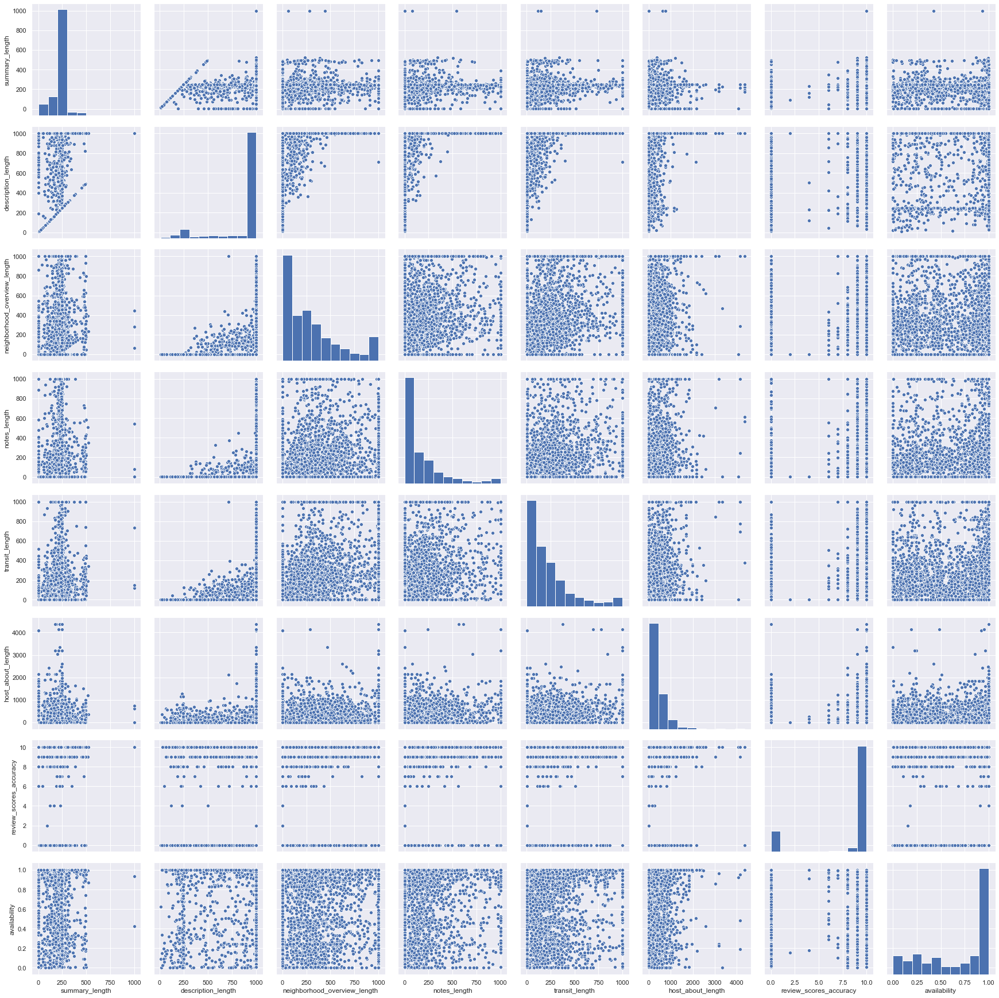

In [557]:
cols = ['summary_length',                          
        'description_length',           
        'neighborhood_overview_length',
        'notes_length',
        'transit_length',
        'host_about_length',
        'review_scores_accuracy',
        'availability']
sns.pairplot(cleaned[cols],size=3)
plt.show()

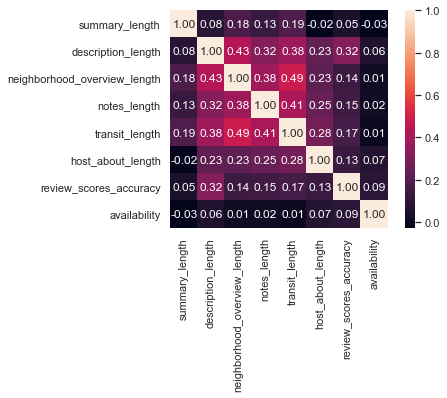

In [558]:
corrs = np.corrcoef(cleaned[cols].values.T)
sns.set(font_scale=1)
hm=sns.heatmap(corrs, cbar = True, annot=True, square = True, fmt = '.2f',
              yticklabels = cols, xticklabels = cols)

Text(0.5, 0, 'Listing price in $')

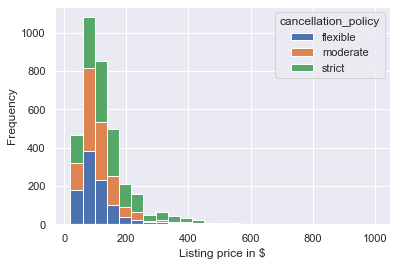

In [559]:
cleaned.pivot(columns = 'cancellation_policy',values = 'price').plot.hist(stacked = True,bins=25)
plt.xlabel('Listing price in $')

#### Impact of the property itself

In [560]:
cols = ['accommodates', 'bathrooms','bedrooms','beds','price']

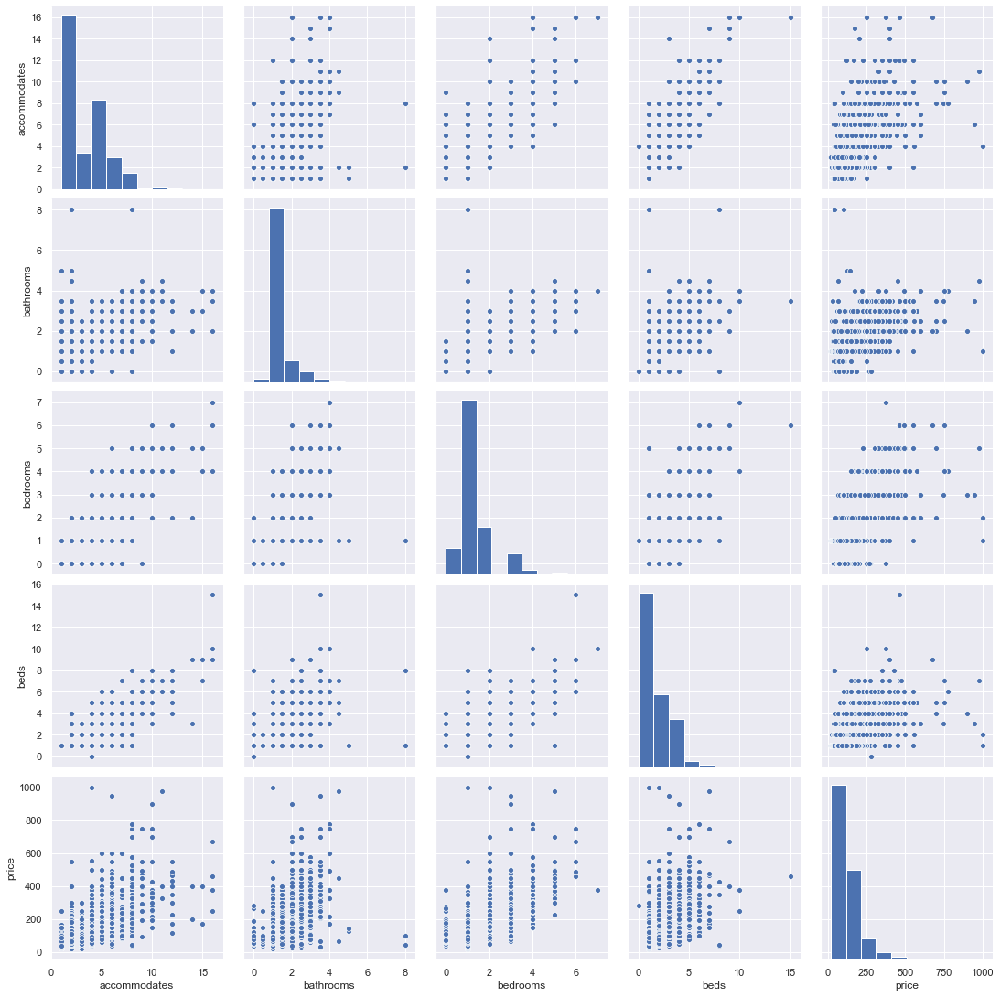

In [561]:
sns.pairplot(cleaned[cols],size=3)
plt.show()

#### **Question 1:** Which property type has the highest booking rates?

In [562]:
booking_rates_per_type = cleaned.groupby(['property_type'])['booking_rate'].mean().sort_values()
average = booking_rates_per_type.mean()
ax = booking_rates_per_type.plot.bar(x='property_type', y='booking_rate')
ax.axhline(average)
plt.show()

KeyError: 'Column not found: booking_rate'

*** 1.1 Average price per property type***

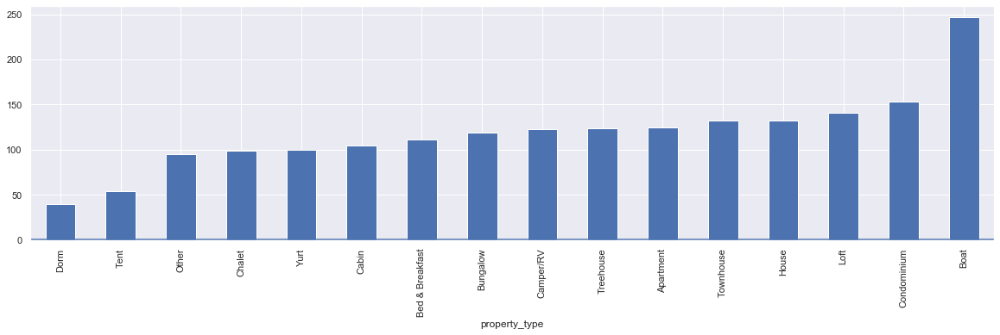

In [563]:
booking_rates_per_neighborhood = cleaned.groupby(['property_type'])['price'].mean().sort_values()
average = booking_rates_per_type.mean()
plt.figure(figsize=(20,5))
ax = booking_rates_per_neighborhood.plot.bar(x='property_type', y='price')
ax.axhline(average)
plt.show()

*** 1.2 Predominant property_type per neighbourhood***

In [564]:
val = cleaned.groupby(['neighbourhood_cleansed'])['property_type'].agg(pd.Series.mode)
val

neighbourhood_cleansed
Adams                                     House
Alki                                      House
Arbor Heights                             House
Atlantic                                  House
Belltown                              Apartment
Bitter Lake                               House
Briarcliff                                House
Brighton                                  House
Broadview                                 House
Broadway                              Apartment
Bryant                                    House
Cedar Park                                House
Central Business District             Apartment
Columbia City                             House
Crown Hill                                House
Dunlap                                    House
East Queen Anne                       Apartment
Eastlake                              Apartment
Fairmount Park                            House
Fauntleroy                                House
First Hill       

***Ranking of amenities per property type***

In [612]:
import re
amenities_criteria = lambda x: True if re.search(r'amenities_', x.name) else False

In [613]:
amenities_col = criteria2columns(cleaned, amenities_criteria, axis = 0)

In [623]:
# how to stand out?
cleaned[amenities_col  + ['property_type']].groupby('property_type').mean().loc['House'].sort_values().head(10)

amenities_amenities_Doorman           0.000000
amenities_Washer / Dryer              0.000622
amenities_Elevator in Building        0.001865
amenities_Pool                        0.003729
amenities_amenities_                  0.007458
amenities_Other pet(s)                0.019888
amenities_Buzzer/Wireless Intercom    0.020510
amenities_Gym                         0.021131
amenities_Smoking Allowed             0.022996
amenities_Wheelchair Accessible       0.022996
Name: House, dtype: float64

***Influence of competitors***


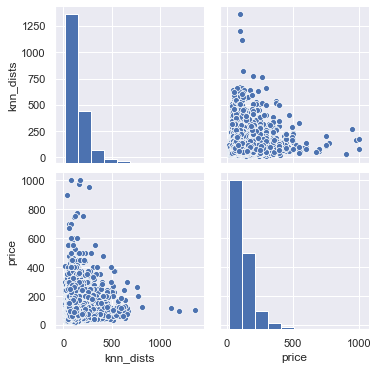

In [566]:
sns.pairplot(cleaned[['knn_dists','price']])

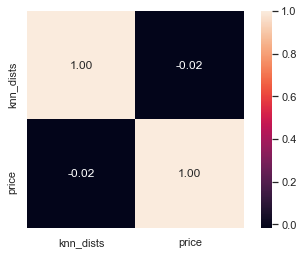

In [625]:
cols =['knn_dists','price']
corrs = np.corrcoef(cleaned[cols].values.T)
sns.set(font_scale=1)
hm=sns.heatmap(corrs, cbar = True, annot=True, square = True, fmt = '.2f',
              yticklabels = cols, xticklabels = cols)

#### **Question 2:** Do the prices vary over the year?

##### 2.1 Average availability rate based on district?

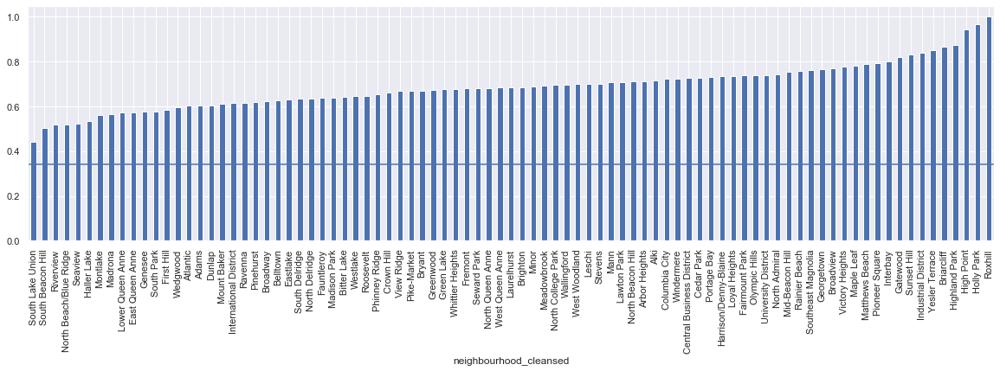

In [568]:
booking_rates_per_neighborhood = cleaned.groupby(['neighbourhood_cleansed'])['availability'].mean().sort_values()
average = booking_rates_per_type.mean()
plt.figure(figsize=(20,5))
ax = booking_rates_per_neighborhood.plot.bar(x='neighbourhood', y='availability')
ax.axhline(average)
plt.show()

***2.2 Average price based on property type and month?***

In [164]:
df_calendar.loc[800000]['date'].month

10

In [167]:
cleaned.loc[10].id[0]

175576

In [585]:
df_calendar['month'] = df_calendar['date'].apply(lambda x: x.month)
df_calendar['year'] = df_calendar['date'].apply(lambda x: x.year)
df_calendar['property_type'] = df_calendar['listing_id'].apply(lambda x: cleaned[cleaned['id'] == x]['property_type'])

KeyboardInterrupt: 

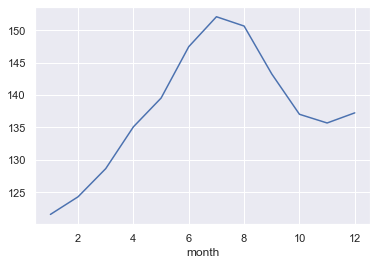

In [583]:
df_calendar[df_calendar['year'] == 2016].groupby('month')['price'].mean().plot()

#### **Question 3:** Predict the price based on the other factors.

In [173]:
(cleaned.isnull().sum() / len(cleaned)).sort_values()

id                                                                                   0.0
neighbourhood_cleansed_Sunset Hill                                                   0.0
neighbourhood_cleansed_University District                                           0.0
neighbourhood_cleansed_Victory Heights                                               0.0
neighbourhood_cleansed_View Ridge                                                    0.0
neighbourhood_cleansed_Wallingford                                                   0.0
neighbourhood_cleansed_Wedgwood                                                      0.0
neighbourhood_cleansed_West Queen Anne                                               0.0
neighbourhood_cleansed_West Woodland                                                 0.0
neighbourhood_cleansed_Westlake                                                      0.0
neighbourhood_cleansed_Whittier Heights                                              0.0
neighbourhood_cleanse

## 4. Data Modeling

In [331]:
#Labelize categorical columns or drop them

In [223]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

pipe = Pipeline([('scaler', StandardScaler()),\
                 ('model', RandomForestClassifier(n_estimators=20))])                      

In [224]:
txt_columns = list(cleaned.select_dtypes('object').keys())

y = cleaned['price']# * cleaned['booking_rate']
X = cleaned.drop(columns=['price', 'booking_rate','id', 'weekly_price', 'monthly_price']).drop(columns=txt_columns)
X.shape

(3512, 230)

In [225]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [226]:
model = pipe.fit(X_train, y_train)

In [227]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [228]:
importances = list(model['model'].feature_importances_)
cols = list(X.columns)
results = pd.DataFrame(data={'col':cols, 'importance':importances})

In [229]:
results = results.sort_values(by='importance', ascending=False)
results

,col,importance
7,longitude,0.028647
6,latitude,0.027194
46,knn_dists,0.026867
47,age,0.024978
37,summary_length,0.024583
35,reviews_per_month,0.022682
22,availability_365,0.022123
23,number_of_reviews,0.021900
42,transit_length,0.021637
14,cleaning_fee,0.021456


In [233]:
top_cols = list(results['col'])[0:5] + ['price', 'booking_rate']

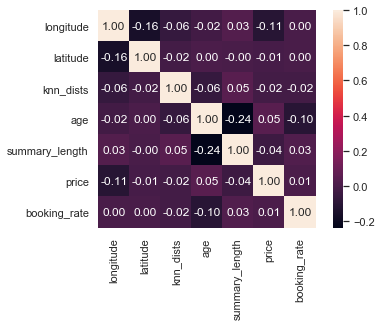

In [234]:
corrs = np.corrcoef(cleaned[top_cols].values.T)
sns.set(font_scale=1)
hm=sns.heatmap(corrs, cbar = True, annot=True, square = True, fmt = '.2f',
              yticklabels = top_cols, xticklabels = top_cols)

In [145]:
y_train_pred = pipe.predict(X_train)
y_test_pred = pipe.predict(X_test)

In [113]:
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 0.000, test: 1866.803
R^2 train: 1.000, test: 0.724


## 5. Evaluation

Learnings:
    
- Drop obviously unnecessary columns already in the beginning and drop them explicitly
- Do data type repair and feature extraction
    - First find all potential columns that a specific repair could be applied on
    - Manually select the columns
    - Apply the repair
- Then again look at the columns and remove those that seem unimportant
- Dummies are only useful for training machine learning models. The original value could be needed for other analysis
- Extract new features in the end, after the data set is cleaned